<a href="https://colab.research.google.com/github/reyndomly/braintumor/blob/main/Brain_Tumor_Classification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Prepare Data

## Clone the Github Repo to access the Dataset

In [ ]:
!git clone https://github.com/reyndomly/braintumor.git

Cloning into 'braintumor'...
remote: Enumerating objects: 6741, done.
remote: Counting objects: 100% (3/3), done.
remote: Compressing objects: 100% (3/3), done.
remote: Total 6741 (delta 0), reused 0 (delta 0), pack-reused 6738
Receiving objects: 100% (6741/6741), 141.97 MiB | 8.82 MiB/s, done.
Checking out files: 100% (7024/7024), done.


In [ ]:
#!rm -rf "/content/dataset-braintumor"

## Import necessary Libraries 

In [ ]:
import os
import random
from tqdm import tqdm
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import cv2
import random
from IPython.display import Image
import imutils   
import ipywidgets as widgets
from google.colab import files
from IPython.display import display,clear_output

from sklearn.metrics import accuracy_score, confusion_matrix, plot_confusion_matrix, classification_report

import keras
import tensorflow.keras as K

import tensorflow as tf
from tensorflow.keras.preprocessing.image import load_img, ImageDataGenerator, array_to_img, img_to_array
from tensorflow.keras.applications import EfficientNetB1
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Flatten, Dense, Conv2D, Dropout, GlobalAveragePooling2D
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau
import imutils    

## Make Directories to save Pre-processed Images

In [ ]:
#Membuat Direktori untuk data Training yang sudah diaugmentasi
os.mkdir('/content/Training-Cropped')
os.mkdir('/content/Training-Cropped/glioma')
os.mkdir('/content/Training-Cropped/meningioma')
os.mkdir('/content/Training-Cropped/pituitary')
os.mkdir('/content/Training-Cropped/notumor')

In [ ]:
#Membuat Direktori untuk data Testing yang sudah diaugmentasi
os.mkdir('/content/Testing-Cropped')
os.mkdir('/content/Testing-Cropped/glioma')
os.mkdir('/content/Testing-Cropped/meningioma')
os.mkdir('/content/Testing-Cropped/pituitary')
os.mkdir('/content/Testing-Cropped/notumor')

## Data Visualization

In [ ]:
#Direktori training
train_dir = '/content/braintumor/Training/'
test_dir = '/content/braintumor/Testing/'

In [ ]:
#Membuat Class
classes = os.listdir('/content/braintumor/Training/')

In [ ]:
classes

['meningioma', 'glioma', 'notumor', 'pituitary']

In [ ]:
files_path_dict = {}

for c in classes:
  files_path_dict[c] = list(map(lambda x: train_dir + c + '/' + x, os.listdir(train_dir + c)))

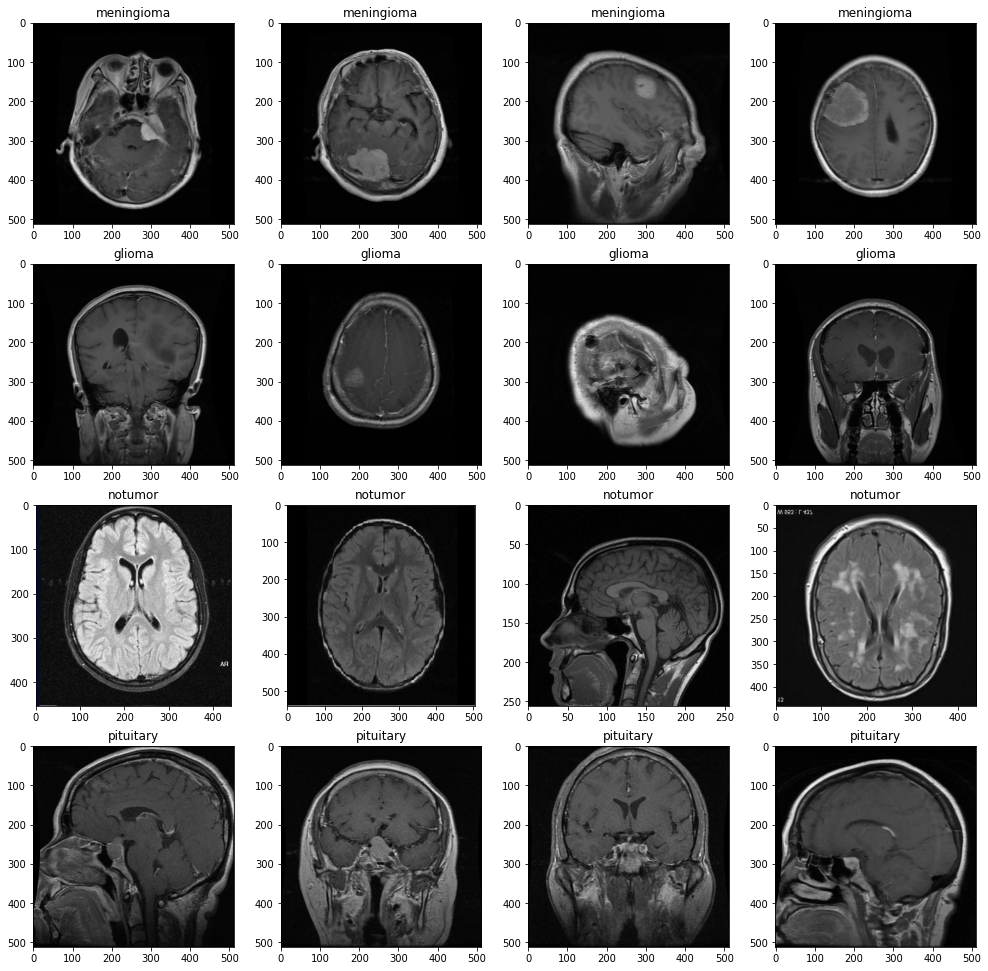

In [ ]:
#Visualisasi Data

plt.figure(figsize = (17,17))
index = 0
for c in classes:
  random.shuffle(files_path_dict[c])
  path_list = files_path_dict[c][:5]

  for i in range(1, 5):
    index += 1
    plt.subplot(4, 4, index)
    plt.imshow(load_img(path_list[i]))
    plt.title(c)

In [ ]:
#check the number of images in each class in the training dataset
No_images_per_class = []
Class_name = []

for i in os.listdir('/content/braintumor/Training/'):
  train_class = os.listdir(os.path.join('/content/braintumor/Training/', i))
  No_images_per_class.append(len(train_class))
  Class_name.append(i)
  print('Number of images in {} = {} \n'.format(i, len(train_class)))

Number of images in meningioma = 1339 

Number of images in glioma = 1321 

Number of images in notumor = 1595 

Number of images in pituitary = 1457 



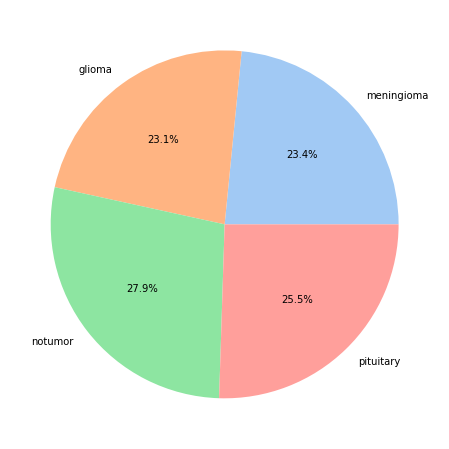

In [ ]:
#visualize class distribution in train set
plt.figure(figsize=(8, 8))
colors = sns.color_palette('pastel')
plt.pie(No_images_per_class, 
        labels = Class_name, 
        autopct = '%1.1f%%',
        colors=colors)
plt.show()

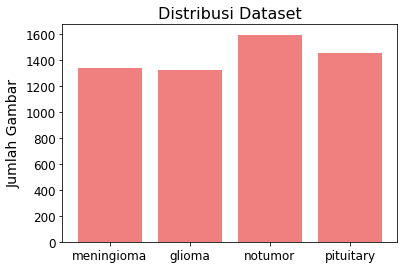

In [ ]:
#No_images_per_class 
#Class_name

plt.bar(Class_name, No_images_per_class, color='lightcoral')

plt.title('Distribusi Dataset', size=16)
plt.ylabel('Jumlah Gambar', size=14)
plt.xticks(size=12)
plt.yticks(size=12)

plt.show()

## Crop Images Function

In [ ]:
def crop_image(image, plot=False):
    
    #convert ke grayscale
    img_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    #blur
    img_gray = cv2.GaussianBlur(img_gray, (5, 5), 0)
    
    #apply binary threshhold
    img_thresh = cv2.threshold(img_gray, 45, 255, cv2.THRESH_BINARY)[1]

    #apply erosion
    img_thresh = cv2.erode(img_thresh, None, iterations=2)

    #dilate images
    img_thresh = cv2.dilate(img_thresh, None, iterations=2)

    #cari contour
    contours = cv2.findContours(img_thresh.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    #ambil contours
    contours = imutils.grab_contours(contours)

    #fintemukan biggest contour
    c = max(contours, key=cv2.contourArea)

    #extract contour positions
    extLeft = tuple(c[c[:, :, 0].argmin()][0])
    extRight = tuple(c[c[:, :, 0].argmax()][0])
    extTop = tuple(c[c[:, :, 1].argmin()][0])
    extBot = tuple(c[c[:, :, 1].argmax()][0])
    
    #generate new image
    new_image = image[extTop[1]:extBot[1], extLeft[0]:extRight[0]]            

    #plot
    if plot:
        plt.figure(figsize=(15, 6))
        plt.subplot(1, 2, 1)
        plt.imshow(image)
        plt.tick_params(axis='both', which='both', top=False, bottom=False, left=False, right=False,labelbottom=False, labeltop=False, labelleft=False, labelright=False)
        plt.title('Original Image')
        plt.subplot(1, 2, 2)
        plt.imshow(new_image)
        plt.tick_params(axis='both', which='both',top=False, bottom=False, left=False, right=False,labelbottom=False, labeltop=False, labelleft=False, labelright=False)
        plt.title('Cropped Image')
        plt.show()
    
    return new_image


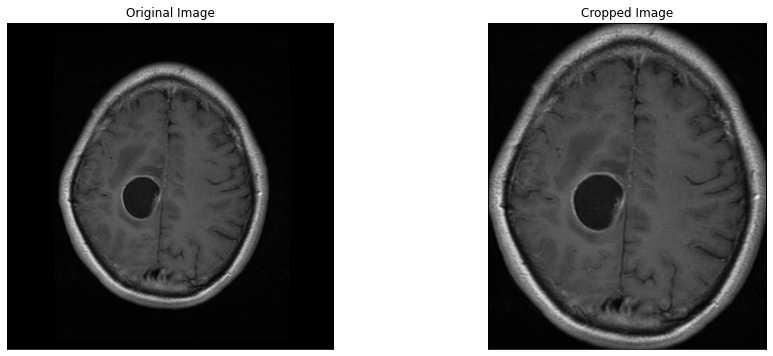

In [ ]:
example_image = cv2.imread('/content/braintumor/Training/glioma/Tr-gl_0054.jpg')
cropped_image = crop_image(example_image, plot=True)


## Pre-process Images 

In [ ]:
#Menerapkan Cropping dan Resize Image
#Lalu disimpan ke folder Cropped Image (Untuk Training)
glioma = train_dir + 'glioma'
meningioma = train_dir + 'meningioma'
pituitary = train_dir + 'pituitary'
no_tumor = train_dir + 'notumor'

j = 0
for i in tqdm(os.listdir(glioma)):
  path = os.path.join(glioma, i)
  img = cv2.imread(path)
  img = crop_image(img, plot=False)

  if img is not None:
    img = cv2.resize(img, (240, 240))
    save_path = '/content/Training-Cropped/glioma/' + str(j) + '.jpg'
    cv2.imwrite(save_path, img)
    j = j + 1

j = 0
for i in tqdm(os.listdir(meningioma)):
  path = os.path.join(meningioma, i)
  img = cv2.imread(path)
  img = crop_image(img, plot=False)

  if img is not None:
    img = cv2.resize(img, (240, 240))
    save_path = '/content/Training-Cropped/meningioma/' + str(j) + '.jpg'
    cv2.imwrite(save_path, img)
    j = j + 1  

j = 0
for i in tqdm(os.listdir(pituitary)):
  path = os.path.join(pituitary, i)
  img = cv2.imread(path)
  img = crop_image(img, plot=False)

  if img is not None:
    img = cv2.resize(img, (240, 240))
    save_path = '/content/Training-Cropped/pituitary/' + str(j) + '.jpg'
    cv2.imwrite(save_path, img)
    j = j + 1  

j = 0
for i in tqdm(os.listdir(no_tumor)):
  path = os.path.join(no_tumor, i)
  img = cv2.imread(path)
  img = crop_image(img, plot=False)

  if img is not None:
    img = cv2.resize(img, (240, 240))
    save_path = '/content/Training-Cropped/notumor/' + str(j) + '.jpg'
    cv2.imwrite(save_path, img)
    j = j + 1  

100%|██████████| 1595/1595 [00:06<00:00, 251.49it/s]


In [ ]:
#Menerapkan Cropping dan Resize Image
#Lalu disimpan ke folder Cropped Image (Untuk Testing)
test_glioma = test_dir + 'glioma'
test_meningioma = test_dir + 'meningioma'
test_pituitary = test_dir + 'pituitary'
test_no_tumor = test_dir + 'notumor'

j = 0
for i in tqdm(os.listdir(test_glioma)):
  path = os.path.join(test_glioma, i)
  img = cv2.imread(path)
  img = crop_image(img, plot=False)

  if img is not None:
    img = cv2.resize(img, (240, 240))
    save_path = '/content/Testing-Cropped/glioma/' + str(j) + '.jpg'
    cv2.imwrite(save_path, img)
    j = j + 1

j = 0
for i in tqdm(os.listdir(test_meningioma)):
  path = os.path.join(test_meningioma, i)
  img = cv2.imread(path)
  img = crop_image(img, plot=False)

  if img is not None:
    img = cv2.resize(img, (240, 240))
    save_path = '/content/Testing-Cropped/meningioma/' + str(j) + '.jpg'
    cv2.imwrite(save_path, img)
    j = j + 1  

j = 0
for i in tqdm(os.listdir(test_pituitary)):
  path = os.path.join(test_pituitary, i)
  img = cv2.imread(path)
  img = crop_image(img, plot=False)

  if img is not None:
    img = cv2.resize(img, (240, 240))
    save_path = '/content/Testing-Cropped/pituitary/' + str(j) + '.jpg'
    cv2.imwrite(save_path, img)
    j = j + 1  

j = 0
for i in tqdm(os.listdir(test_no_tumor)):
  path = os.path.join(test_no_tumor, i)
  img = cv2.imread(path)
  img = crop_image(img, plot=False)

  if img is not None:
    img = cv2.resize(img, (240, 240))
    save_path = '/content/Testing-Cropped/notumor/' + str(j) + '.jpg'
    cv2.imwrite(save_path, img)
    j = j + 1  


100%|██████████| 405/405 [00:01<00:00, 304.39it/s]


## Data Augmentation

In [ ]:
datagen = ImageDataGenerator(rotation_range=10,
                             horizontal_flip=True,
                             validation_split=0.2)

train_data = datagen.flow_from_directory('/content/Training-Cropped/',
                                         target_size=(240, 240),
                                         batch_size=32,
                                         class_mode='categorical',
                                         subset='training')

valid_data = datagen.flow_from_directory('/content/Training-Cropped/',
                                         target_size=(240, 240),
                                         batch_size=32,
                                         class_mode='categorical',
                                         subset='validation')

#test set
test_datagen = ImageDataGenerator()

test_data = datagen.flow_from_directory('/content/Testing-Cropped/',
                                         target_size=(240, 240),
                                        class_mode='categorical',
                                        shuffle=False)

Found 4571 images belonging to 4 classes.
Found 1141 images belonging to 4 classes.
Found 1311 images belonging to 4 classes.


In [ ]:
#view the class dictionary
print(train_data.class_indices)
print(test_data.class_indices)

{'glioma': 0, 'meningioma': 1, 'notumor': 2, 'pituitary': 3}
{'glioma': 0, 'meningioma': 1, 'notumor': 2, 'pituitary': 3}


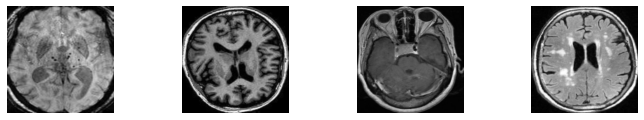

In [ ]:
#view the augmented data
sample_x, sample_y = next(train_data)
plt.figure(figsize=(12, 9))
for i in range(4):
  plt.subplot(4, 4, i+1)
  sample = array_to_img(sample_x[i])
  plt.axis('off')
  plt.grid(True)
  plt.imshow(sample)
plt.show()

#Without Transfer Learning

## Model Architect

In [ ]:
effnet = EfficientNetB1(weights=None,
                        classes=4, 
                        include_top=True, 
                        input_shape=(240, 240, 3))
model = effnet.output
model = Model(inputs=effnet.input, 
              outputs=model)
model.summary()

Model: "model_19"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 240, 240, 3  0           []                               
                                )]                                                                
                                                                                                  
 rescaling_1 (Rescaling)        (None, 240, 240, 3)  0           ['input_2[0][0]']                
                                                                                                  
 normalization_1 (Normalization  (None, 240, 240, 3)  7          ['rescaling_1[0][0]']            
 )                                                                                                
                                                                                           

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.8666 to fit



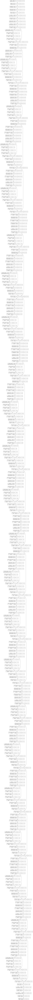

In [ ]:
from keras.utils.vis_utils import plot_model

#plot
plot_model(model, to_file = 'model_plot.png', show_shapes = True, show_layer_names = True)

## Compile Model

In [ ]:
#compile model
model.compile(optimizer=Adam(lr=0.001),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

#define checkpoint
checkpoint = ModelCheckpoint('model.h5', 
                             monitor='val_accuracy',
                             save_best_only=True,
                             mode='auto',
                             verbose=1)

#early stopping
earlystop = EarlyStopping(monitor='val_accuracy',
                          patience=5,
                          mode='auto',
                          verbose=1)

#reduce learning rate
reduce_lr = ReduceLROnPlateau(monitor = 'val_accuracy', 
                              factor = 0.3, 
                              patience = 2, 
                              min_delta = 0.001,
                              mode='auto',
                              verbose=1)

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


## Model Training and Model Evaluation

In [ ]:
%%time

#train the model
history = model.fit(train_data,
                    epochs = 12,
                    validation_data=valid_data,
                    verbose=1,
                    callbacks=[checkpoint, earlystop, reduce_lr])

Epoch 1/12
143/143 [==============================] - ETA: 0s - loss: 1.6627 - accuracy: 0.4564
Epoch 1: val_accuracy improved from -inf to 0.23401, saving model to model.h5
143/143 [==============================] - 98s 573ms/step - loss: 1.6627 - accuracy: 0.4564 - val_loss: 2.0768 - val_accuracy: 0.2340 - lr: 0.0010
Epoch 2/12
143/143 [==============================] - ETA: 0s - loss: 1.0276 - accuracy: 0.6104
Epoch 2: val_accuracy improved from 0.23401 to 0.29010, saving model to model.h5
143/143 [==============================] - 79s 547ms/step - loss: 1.0276 - accuracy: 0.6104 - val_loss: 1.6584 - val_accuracy: 0.2901 - lr: 0.0010
Epoch 3/12
143/143 [==============================] - ETA: 0s - loss: 0.8552 - accuracy: 0.6872
Epoch 3: val_accuracy improved from 0.29010 to 0.43032, saving model to model.h5
143/143 [==============================] - 78s 542ms/step - loss: 0.8552 - accuracy: 0.6872 - val_loss: 1.2705 - val_accuracy: 0.4303 - lr: 0.0010
Epoch 4/12
143/143 [===========

## Model Evaluation

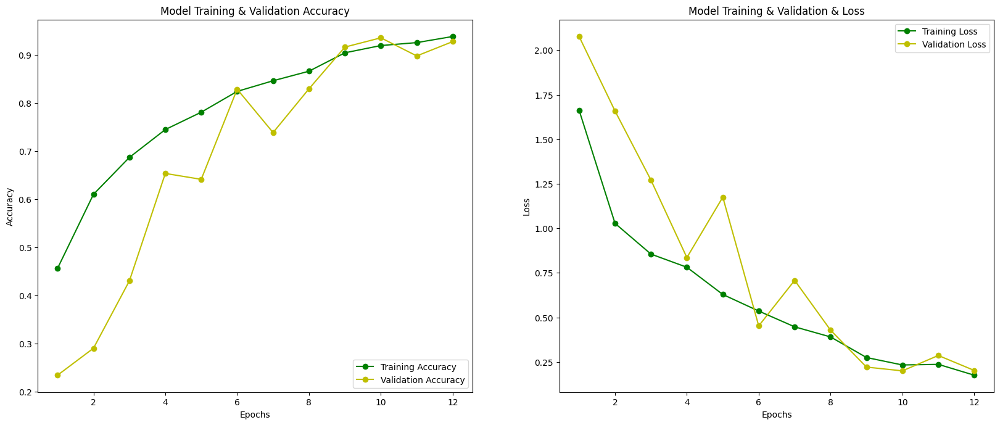

In [ ]:
fig , ax = plt.subplots(1,2)
fig.set_size_inches(20, 8)

train_acc = history.history['accuracy']
train_loss = history.history['loss']
val_acc = history.history['val_accuracy']
val_loss = history.history['val_loss']

epochs = range(1, len(train_acc) + 1)

ax[0].plot(epochs , train_acc , 'g-o' , label = 'Training Accuracy')
ax[0].plot(epochs , val_acc , 'y-o' , label = 'Validation Accuracy')
ax[0].set_title('Model Training & Validation Accuracy')
ax[0].legend(loc = 'lower right')
ax[0].set_xlabel("Epochs")
ax[0].set_ylabel("Accuracy")

ax[1].plot(epochs , train_loss , 'g-o' , label = 'Training Loss')
ax[1].plot(epochs , val_loss , 'y-o' , label = 'Validation Loss')
ax[1].set_title('Model Training & Validation & Loss')
ax[1].legend()
ax[1].set_xlabel("Epochs")
ax[1].set_ylabel("Loss")

plt.show()

In [ ]:
print('Train accuracy & loss:', model.evaluate(train_data))
print('\n')
print('Test accuracy & loss:', model.evaluate(test_data))

143/143 [==============================] - 59s 415ms/step - loss: 0.1363 - accuracy: 0.9503
Train accuracy & loss: [0.1363440603017807, 0.9503390789031982]


41/41 [==============================] - 17s 411ms/step - loss: 0.2119 - accuracy: 0.9230
Test accuracy & loss: [0.21192048490047455, 0.922959566116333]


In [ ]:
#define labels for testing
y_test = test_data.classes

#make prediction
yhat_test = np.argmax(model.predict(test_data), axis=1)

In [ ]:
y_test

array([0, 0, 0, ..., 3, 3, 3], dtype=int32)

In [ ]:
yhat_test

array([0, 0, 0, ..., 3, 3, 3])

In [ ]:
import itertools
def plot_confusion_matrix(cm, classes,
                          normalize = False,
                          title = 'Confusion Matrix',
                          cmap = plt.cm.Blues):
    
    plt.figure(figsize = (6,6))
    plt.imshow(cm, interpolation = 'nearest', cmap = cmap)
    plt.title(title)
    plt.colorbar()
    plt.grid(False)
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation = 90)
    plt.yticks(tick_marks, classes)
    if normalize:
        cm = cm.astype('float') / cm.sum(axis = 1)[:, np.newaxis]

    thresh = cm.max() / 2.
    cm = np.round(cm,2)
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, cm[i, j],
                 fontsize = 12,
                 horizontalalignment = "center",
                 color = "white" if cm[i, j] > thresh else "black")
    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.show()

[[286   8   0   6]
 [ 33 224  42   7]
 [  1   0 403   1]
 [ 11   0   2 287]]


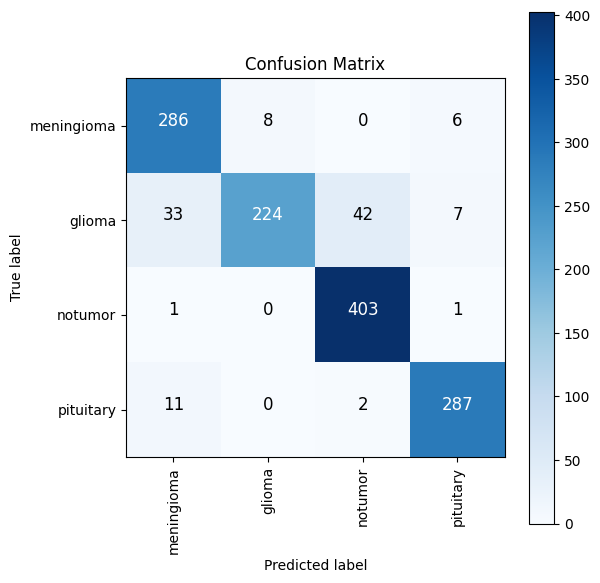

In [ ]:
#get confusion matrix
cm = confusion_matrix(y_test, yhat_test)
print(cm)

#plot
plot_confusion_matrix(cm, classes, normalize=False)

In [ ]:
#get classification report
#print(classification_report(y_test, yhat_test))
print(classification_report(y_test, yhat_test))

              precision    recall  f1-score   support

           0       0.86      0.95      0.91       300
           1       0.97      0.73      0.83       306
           2       0.90      1.00      0.95       405
           3       0.95      0.96      0.96       300

    accuracy                           0.92      1311
   macro avg       0.92      0.91      0.91      1311
weighted avg       0.92      0.92      0.91      1311



## Obtaining Predictions on Test Images

In [ ]:
import PIL

class_dict = {0: 'glioma',
              1: 'meningioma',
              2: 'notumor',
              3: 'pituitary'}
              
prediction = []
original = []
image = []
count = 0
for i in os.listdir('/content/Testing-Cropped/'):
  for item in os.listdir(os.path.join('/content/Testing-Cropped', i)):
    # code to open the image
    img= PIL.Image.open(os.path.join('/content/Testing-Cropped', i, item))
    #append to image list
    image.append(img)
    #expand dimension
    img = np.expand_dims(img, axis=0)
    #predict
    predict = model.predict(img)
    #get the index corresponding to the highest value in the prediction
    predict = np.argmax(predict)
    #append the predicted class to the list
    prediction.append(class_dict[predict])
    #append original class to the list
    original.append(i)

In [ ]:
#test accuracy 
score = accuracy_score(original, prediction)
print("Test Accuracy : {}".format(score))

Test Accuracy : 0.916094584286804


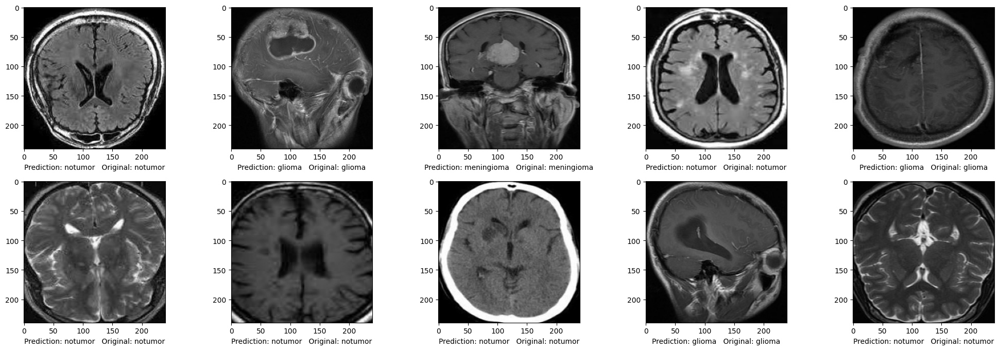

In [ ]:
#visualize the results
fig = plt.figure(figsize = (20, 20))
for i in range(10):
    j = random.randint(0, len(image))
    fig.add_subplot(6, 5, i+1)
    plt.xlabel("Prediction: " + prediction[j] +"   Original: " + original[j])
    plt.imshow(image[j])
fig.tight_layout()
plt.show()

In [ ]:
gambar = cv2.imread("/content/Testing-Cropped/meningioma/103.jpg")
#gambar1 = crop_image(gambar)
#gambara = cv2.resize(gambar1, (240, 240))
gambar2 = np.asarray(gambar, dtype = np.float32)
gambar3 = np.expand_dims(gambar2, axis=0)
model.predict(gambar3)

array([[0.04106389, 0.4936333 , 0.08674974, 0.37855312]], dtype=float32)

In [ ]:
#!cp '/content/drive/MyDrive/Model Skripsi/model final bgt.h5' '/content/'

#With Transfer Learning

## Model Architect

In [ ]:
#build the model
effnet = EfficientNetB1(weights='imagenet', 
                        include_top=False, 
                        input_shape=(240, 240, 3))

model = effnet.output
model = GlobalAveragePooling2D()(model)
model = Dropout(0.5)(model)
model = Dense(4, activation='softmax')(model)
model = Model(inputs=effnet.input, 
              outputs=model)

#get summary()
model.summary()

27033600/27018416 [==============================] - 0s 0us/step
Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 240, 240, 3  0           []                               
                                )]                                                                
                                                                                                  
 rescaling (Rescaling)          (None, 240, 240, 3)  0           ['input_1[0][0]']                
                                                                                                  
 normalization (Normalization)  (None, 240, 240, 3)  7           ['rescaling[0][0]']              
                                                                                                  
 stem_conv_pad (ZeroPadding2D

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.8666 to fit



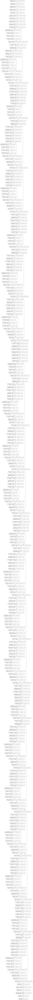

In [ ]:
from keras.utils.vis_utils import plot_model

#plot
plot_model(model, to_file = 'model_plot.png', show_shapes = True, show_layer_names = True)

## Compile Model

In [ ]:
#compile model
model.compile(optimizer=Adam(lr=0.001),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

#define checkpoint
checkpoint = ModelCheckpoint('model.h5', 
                             monitor='val_accuracy',
                             save_best_only=True,
                             mode='auto',
                             verbose=1)

#early stopping
earlystop = EarlyStopping(monitor='val_accuracy',
                          patience=5,
                          mode='auto',
                          verbose=1)

#reduce learning rate
reduce_lr = ReduceLROnPlateau(monitor = 'val_accuracy', 
                              factor = 0.3, 
                              patience = 2, 
                              min_delta = 0.001,
                              mode='auto',
                              verbose=1)

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


## Model Training and Model Evaluation

In [ ]:
%%time

#train the model
history = model.fit(train_data,
                    epochs = 12,
                    validation_data=valid_data,
                    verbose=1,
                    callbacks=[checkpoint, earlystop, reduce_lr])

Epoch 1/12
143/143 [==============================] - ETA: 0s - loss: 0.2956 - accuracy: 0.8911
Epoch 1: val_accuracy improved from -inf to 0.90710, saving model to model.h5
143/143 [==============================] - 106s 547ms/step - loss: 0.2956 - accuracy: 0.8911 - val_loss: 0.4284 - val_accuracy: 0.9071 - lr: 0.0010
Epoch 2/12
143/143 [==============================] - ETA: 0s - loss: 0.1224 - accuracy: 0.9602
Epoch 2: val_accuracy improved from 0.90710 to 0.91060, saving model to model.h5
143/143 [==============================] - 76s 530ms/step - loss: 0.1224 - accuracy: 0.9602 - val_loss: 0.2407 - val_accuracy: 0.9106 - lr: 0.0010
Epoch 3/12
143/143 [==============================] - ETA: 0s - loss: 0.1035 - accuracy: 0.9657
Epoch 3: val_accuracy improved from 0.91060 to 0.95793, saving model to model.h5
143/143 [==============================] - 76s 528ms/step - loss: 0.1035 - accuracy: 0.9657 - val_loss: 0.1433 - val_accuracy: 0.9579 - lr: 0.0010
Epoch 4/12
143/143 [==========

## Model Evaluation

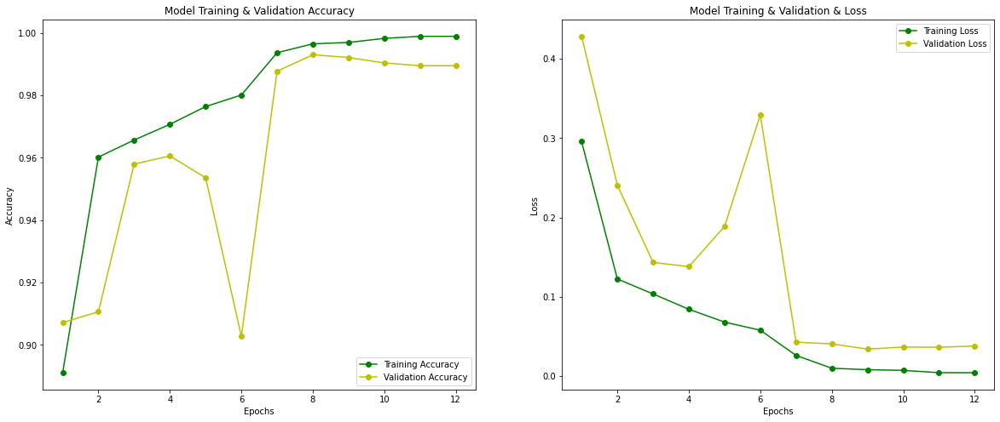

In [ ]:
fig , ax = plt.subplots(1,2)
fig.set_size_inches(20, 8)

train_acc = history.history['accuracy']
train_loss = history.history['loss']
val_acc = history.history['val_accuracy']
val_loss = history.history['val_loss']

epochs = range(1, len(train_acc) + 1)

ax[0].plot(epochs , train_acc , 'g-o' , label = 'Training Accuracy')
ax[0].plot(epochs , val_acc , 'y-o' , label = 'Validation Accuracy')
ax[0].set_title('Model Training & Validation Accuracy')
ax[0].legend(loc = 'lower right')
ax[0].set_xlabel("Epochs")
ax[0].set_ylabel("Accuracy")

ax[1].plot(epochs , train_loss , 'g-o' , label = 'Training Loss')
ax[1].plot(epochs , val_loss , 'y-o' , label = 'Validation Loss')
ax[1].set_title('Model Training & Validation & Loss')
ax[1].legend()
ax[1].set_xlabel("Epochs")
ax[1].set_ylabel("Loss")

plt.show()

In [ ]:
print('Train accuracy & loss:', model.evaluate(train_data))
print('\n')
print('Test accuracy & loss:', model.evaluate(test_data))

143/143 [==============================] - 59s 410ms/step - loss: 0.0019 - accuracy: 0.9991
Train accuracy & loss: [0.0018788097659125924, 0.9991249442100525]


41/41 [==============================] - 17s 416ms/step - loss: 0.0136 - accuracy: 0.9969
Test accuracy & loss: [0.013592314906418324, 0.9969488978385925]


In [ ]:
#define labels for testing
y_test = test_data.classes

#make prediction
yhat_test = np.argmax(model.predict(test_data), axis=1)

In [ ]:
y_test

array([0, 0, 0, ..., 3, 3, 3], dtype=int32)

In [ ]:
yhat_test

array([0, 0, 0, ..., 3, 3, 3])

In [ ]:
import itertools
def plot_confusion_matrix(cm, classes,
                          normalize = False,
                          title = 'Confusion Matrix',
                          cmap = plt.cm.Blues):
    
    plt.figure(figsize = (6,6))
    plt.imshow(cm, interpolation = 'nearest', cmap = cmap)
    plt.title(title)
    plt.colorbar()
    plt.grid(False)
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation = 90)
    plt.yticks(tick_marks, classes)
    if normalize:
        cm = cm.astype('float') / cm.sum(axis = 1)[:, np.newaxis]

    thresh = cm.max() / 2.
    cm = np.round(cm,2)
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, cm[i, j],
                 fontsize = 12,
                 horizontalalignment = "center",
                 color = "white" if cm[i, j] > thresh else "black")
    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.show()

[[298   2   0   0]
 [  0 305   0   1]
 [  0   0 405   0]
 [  0   1   0 299]]


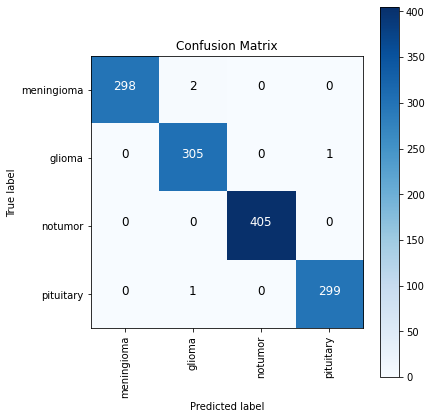

In [ ]:
#get confusion matrix
cm = confusion_matrix(y_test, yhat_test)
print(cm)

#plot
plot_confusion_matrix(cm, classes, normalize=False)

In [ ]:
#get classification report
#print(classification_report(y_test, yhat_test))
print(classification_report(y_test, yhat_test))

              precision    recall  f1-score   support

           0       1.00      0.99      1.00       300
           1       0.99      1.00      0.99       306
           2       1.00      1.00      1.00       405
           3       1.00      1.00      1.00       300

    accuracy                           1.00      1311
   macro avg       1.00      1.00      1.00      1311
weighted avg       1.00      1.00      1.00      1311



## Obtaining Predictions on Test Images

In [ ]:
import PIL

class_dict = {0: 'glioma',
              1: 'meningioma',
              2: 'notumor',
              3: 'pituitary'}
              
prediction = []
original = []
image = []
count = 0
for i in os.listdir('/content/Testing-Cropped/'):
  for item in os.listdir(os.path.join('/content/Testing-Cropped', i)):
    # code to open the image
    img= PIL.Image.open(os.path.join('/content/Testing-Cropped', i, item))
    #append to image list
    image.append(img)
    #expand dimension
    img = np.expand_dims(img, axis=0)
    #predict
    predict = model.predict(img)
    #get the index corresponding to the highest value in the prediction
    predict = np.argmax(predict)
    #append the predicted class to the list
    prediction.append(class_dict[predict])
    #append original class to the list
    original.append(i)

In [ ]:
#test accuracy 
score = accuracy_score(original, prediction)
print("Test Accuracy : {}".format(score))

Test Accuracy : 0.996186117467582


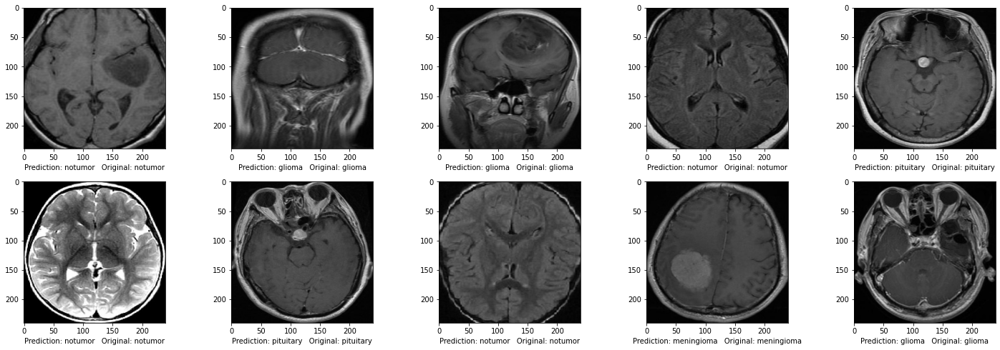

In [ ]:
#visualize the results
fig = plt.figure(figsize = (20, 20))
for i in range(10):
    j = random.randint(0, len(image))
    fig.add_subplot(6, 5, i+1)
    plt.xlabel("Prediction: " + prediction[j] +"   Original: " + original[j])
    plt.imshow(image[j])
fig.tight_layout()
plt.show()

In [ ]:
len(image)

1311

prediction

In [ ]:
last_conv_layer = next(x for x in model.layers[::-1] if isinstance(x, K.layers.Conv2D))
last_conv_layer.name

'top_conv'

In [ ]:
#https://github.com/gkeechin/vizgradcam/blob/main/gradcam.py

def VizGradCAM(model, image, interpolant=0.5, plot_results=True):

    """VizGradCAM - Displays GradCAM based on Keras / TensorFlow models
    using the gradients from the last convolutional layer. This function
    should work with all Keras Application listed here:
    https://keras.io/api/applications/
    Parameters:
    model (keras.model): Compiled Model with Weights Loaded
    image: Image to Perform Inference On
    plot_results (boolean): True - Function Plots using PLT
                            False - Returns Heatmap Array
    Returns:
    Heatmap Array?
    """
    #sanity check
    assert (interpolant > 0 and interpolant < 1), "Heatmap Interpolation Must Be Between 0 - 1"

    #STEP 1: Preprocesss image and make prediction using our model
    #input image
    original_img = np.asarray(image, dtype = np.float32)
    #expamd dimension and get batch size
    img = np.expand_dims(original_img, axis=0)
    #predict
    prediction = model.predict(img)
    #prediction index
    prediction_idx = np.argmax(prediction)

    #STEP 2: Create new model
    #specify last convolutional layer
    last_conv_layer = next(x for x in model.layers[::-1] if isinstance(x, K.layers.Conv2D))
    target_layer = model.get_layer(last_conv_layer.name)

    #compute gradient of top predicted class
    with tf.GradientTape() as tape:
        #create a model with original model inputs and the last conv_layer as the output
        gradient_model = Model([model.inputs], [target_layer.output, model.output])
        #pass the image through the base model and get the feature map  
        conv2d_out, prediction = gradient_model(img)
        #prediction loss
        loss = prediction[:, prediction_idx]

    #gradient() computes the gradient using operations recorded in context of this tape
    gradients = tape.gradient(loss, conv2d_out)

    #obtain the output from shape [1 x H x W x CHANNEL] -> [H x W x CHANNEL]
    output = conv2d_out[0]

    #obtain depthwise mean
    weights = tf.reduce_mean(gradients[0], axis=(0, 1))


    #create a 7x7 map for aggregation
    activation_map = np.zeros(output.shape[0:2], dtype=np.float32)
    #multiply weight for every layer
    for idx, weight in enumerate(weights):
        activation_map += weight * output[:, :, idx]
    #resize to image size
    activation_map = cv2.resize(activation_map.numpy(), 
                                (original_img.shape[1], 
                                 original_img.shape[0]))
    #ensure no negative number
    activation_map = np.maximum(activation_map, 0)
    #convert class activation map to 0 - 255
    activation_map = (activation_map - activation_map.min()) / (activation_map.max() - activation_map.min())
    #rescale and convert the type to int
    activation_map = np.uint8(255 * activation_map)


    #convert to heatmap
    heatmap = cv2.applyColorMap(activation_map, cv2.COLORMAP_JET)

    #superimpose heatmap onto image
    original_img = np.uint8((original_img - original_img.min()) / (original_img.max() - original_img.min()) * 255)
    cvt_heatmap = cv2.cvtColor(heatmap, cv2.COLOR_BGR2RGB)
    cvt_heatmap = img_to_array(cvt_heatmap)

    #enlarge plot
    plt.rcParams["figure.dpi"] = 100

    if plot_results == True:
        plt.imshow(np.uint8(original_img * interpolant + cvt_heatmap * (1 - interpolant)))
    else:
        return cvt_heatmap

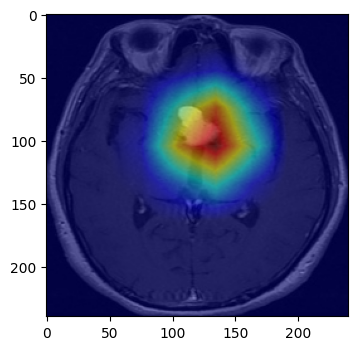

In [ ]:
#load image
test_img = cv2.imread("/content/Testing-Cropped/meningioma/103.jpg")

#apply function
VizGradCAM(model, img_to_array(test_img), plot_results=True)

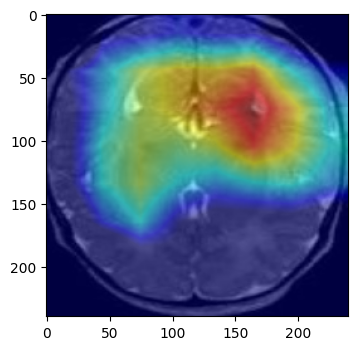

In [ ]:
#load image
test_img = cv2.imread("/content/Testing-Cropped/notumor/103.jpg")

#apply function
VizGradCAM(model, img_to_array(test_img), plot_results=True)

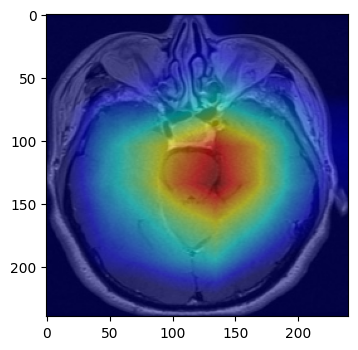

In [ ]:
#load image
test_img = cv2.imread("/content/Testing-Cropped/pituitary/140.jpg")

#apply function
VizGradCAM(model, img_to_array(test_img), plot_results=True)

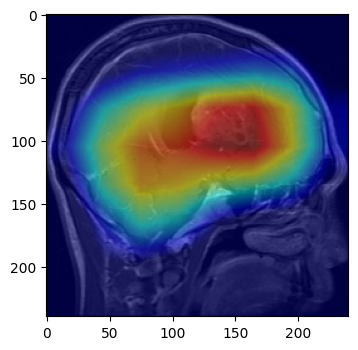

In [ ]:
#load image
test_img = cv2.imread("/content/Testing-Cropped/glioma/132.jpg")
#test_img = cv2.imread("/content/Testing-Cropped/glioma/11.jpg")

#apply function
VizGradCAM(model, img_to_array(test_img), plot_results=True)

In [ ]:
#!cp "/content/model final bgt.h5" "/content/drive/MyDrive/Model Skripsi"

In [ ]:
!cp "/content/drive/MyDrive/Model Skripsi/model.h5" "/content/" 

In [ ]:
model = keras.models.load_model('/content/model.h5')

array([[2.4103761e-07, 9.9997795e-01, 1.7281634e-05, 4.5643319e-06]],
      dtype=float32)

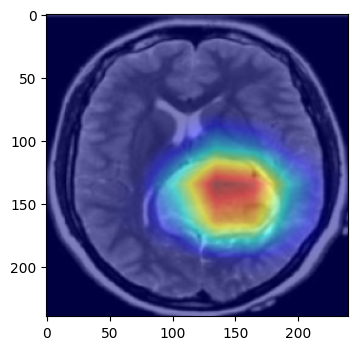

In [ ]:
gambar = cv2.imread("/content/Testing-Cropped/meningioma/118.jpg")
#gambar1 = crop_image(gambar)
#gambara = cv2.resize(gambar1, (240, 240))
VizGradCAM(model, img_to_array(gambara), plot_results=True)


gambar2 = np.asarray(gambar, dtype = np.float32)
gambar3 = np.expand_dims(gambar2, axis=0)
model.predict(gambar3)

In [ ]:
!cp '/content/model.h5' '/content/drive/MyDrive/Model Skripsi/' 